In [1]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt

# Import PCA from sci-kit learn
from sklearn.decomposition import PCA
import hvplot.pandas

In [2]:
df = pd.read_csv('../Resources/marathon_results_2019.csv')
df.head()

,Bib,Name,Age,M/F,City,State,Country,Citizen,Unnamed: 8,5K,...,25K,30K,35K,40K,Pace,Proj Time,Official Time,Overall,Gender,Division
0,2,"Cherono, Lawrence",30,M,Eldoret,NaN,KEN,NaN,NaN,0:15:11,...,1:16:23,1:32:01,1:47:16,2:01:45,0:04:53,NaN,2:07:57,1,1,1
1,6,"Desisa, Lelisa",29,M,Ambo,NaN,ETH,NaN,NaN,0:15:10,...,1:16:24,1:32:01,1:47:16,2:01:46,0:04:53,NaN,2:07:59,2,2,2
2,7,"Kipkemoi, Kenneth",34,M,Eldoret,NaN,KEN,NaN,NaN,0:15:14,...,1:16:24,1:32:01,1:47:16,2:01:45,0:04:54,NaN,2:08:07,3,3,3
3,8,"Kandie, Felix",32,M,Iten,NaN,KEN,NaN,NaN,0:15:14,...,1:16:24,1:32:01,1:47:16,2:02:08,0:04:55,NaN,2:08:54,4,4,4
4,11,"Kirui, Geoffrey",26,M,Keringet,NaN,KEN,NaN,NaN,0:15:12,...,1:16:23,1:32:01,1:47:16,2:01:57,0:04:56,NaN,2:08:55,5,5,5


In [3]:
# Subset the dataframe to only the columns "Age", "M/F", split times (i.e. "5K, 10K", etc.), "Pace", and "Official Time". 
df = df[['Age', 'M/F', '5K', '10K', '15K', '20K', 'Half', '25K', '30K', '35K', '40K', 'Pace', 'Official Time']]
df.head()

,Age,M/F,5K,10K,15K,20K,Half,25K,30K,35K,40K,Pace,Official Time
0,30,M,0:15:11,0:30:21,0:45:48,1:01:16,1:04:29,1:16:23,1:32:01,1:47:16,2:01:45,0:04:53,2:07:57
1,29,M,0:15:10,0:30:22,0:45:46,1:01:16,1:04:30,1:16:24,1:32:01,1:47:16,2:01:46,0:04:53,2:07:59
2,34,M,0:15:14,0:30:22,0:45:47,1:01:17,1:04:31,1:16:24,1:32:01,1:47:16,2:01:45,0:04:54,2:08:07
3,32,M,0:15:14,0:30:24,0:45:47,1:01:16,1:04:31,1:16:24,1:32:01,1:47:16,2:02:08,0:04:55,2:08:54
4,26,M,0:15:12,0:30:21,0:45:46,1:01:15,1:04:28,1:16:23,1:32:01,1:47:16,2:01:57,0:04:56,2:08:55


In [4]:
# Convert the split times, "Pace", and "Official Time" to timedeltas using apply() and pandas.to_timedelta()
time_columns = ['5K', '10K', '15K', '20K', 'Half','25K', '30K', '35K', '40K', 'Pace', 'Official Time']
df[time_columns] = df[time_columns].apply(pd.to_timedelta)
df.head()

,Age,M/F,5K,10K,15K,20K,Half,25K,30K,35K,40K,Pace,Official Time
0,30,M,0 days 00:15:11,0 days 00:30:21,0 days 00:45:48,0 days 01:01:16,0 days 01:04:29,0 days 01:16:23,0 days 01:32:01,0 days 01:47:16,0 days 02:01:45,0 days 00:04:53,0 days 02:07:57
1,29,M,0 days 00:15:10,0 days 00:30:22,0 days 00:45:46,0 days 01:01:16,0 days 01:04:30,0 days 01:16:24,0 days 01:32:01,0 days 01:47:16,0 days 02:01:46,0 days 00:04:53,0 days 02:07:59
2,34,M,0 days 00:15:14,0 days 00:30:22,0 days 00:45:47,0 days 01:01:17,0 days 01:04:31,0 days 01:16:24,0 days 01:32:01,0 days 01:47:16,0 days 02:01:45,0 days 00:04:54,0 days 02:08:07
3,32,M,0 days 00:15:14,0 days 00:30:24,0 days 00:45:47,0 days 01:01:16,0 days 01:04:31,0 days 01:16:24,0 days 01:32:01,0 days 01:47:16,0 days 02:02:08,0 days 00:04:55,0 days 02:08:54
4,26,M,0 days 00:15:12,0 days 00:30:21,0 days 00:45:46,0 days 01:01:15,0 days 01:04:28,0 days 01:16:23,0 days 01:32:01,0 days 01:47:16,0 days 02:01:57,0 days 00:04:56,0 days 02:08:55


In [5]:
# Convert timedeltas to seconds by applying the lambda function lambda x: x.dt.total_seconds()
df[time_columns] = df[time_columns].apply(lambda x: x.dt.total_seconds())
df.head()

,Age,M/F,5K,10K,15K,20K,Half,25K,30K,35K,40K,Pace,Official Time
0,30,M,911.0,1821.0,2748.0,3676.0,3869.0,4583.0,5521.0,6436.0,7305.0,293.0,7677.0
1,29,M,910.0,1822.0,2746.0,3676.0,3870.0,4584.0,5521.0,6436.0,7306.0,293.0,7679.0
2,34,M,914.0,1822.0,2747.0,3677.0,3871.0,4584.0,5521.0,6436.0,7305.0,294.0,7687.0
3,32,M,914.0,1824.0,2747.0,3676.0,3871.0,4584.0,5521.0,6436.0,7328.0,295.0,7734.0
4,26,M,912.0,1821.0,2746.0,3675.0,3868.0,4583.0,5521.0,6436.0,7317.0,296.0,7735.0


In [6]:
# Subset df to only rows where the split values are non-zero
df = df[
    (df['5K'] != 0) & 
    (df['10K'] != 0) & 
    (df['15K'] != 0) & 
    (df['20K'] != 0) & 
    (df['Half'] != 0) & 
    (df['25K'] != 0) & 
    (df['30K'] != 0) & 
    (df['35K'] != 0) & 
    (df['40K'] != 0)
]

# A more concise method
#df[~(df == 0).any(axis=1)]

df.head()

,Age,M/F,5K,10K,15K,20K,Half,25K,30K,35K,40K,Pace,Official Time
0,30,M,911.0,1821.0,2748.0,3676.0,3869.0,4583.0,5521.0,6436.0,7305.0,293.0,7677.0
1,29,M,910.0,1822.0,2746.0,3676.0,3870.0,4584.0,5521.0,6436.0,7306.0,293.0,7679.0
2,34,M,914.0,1822.0,2747.0,3677.0,3871.0,4584.0,5521.0,6436.0,7305.0,294.0,7687.0
3,32,M,914.0,1824.0,2747.0,3676.0,3871.0,4584.0,5521.0,6436.0,7328.0,295.0,7734.0
4,26,M,912.0,1821.0,2746.0,3675.0,3868.0,4583.0,5521.0,6436.0,7317.0,296.0,7735.0


In [7]:
# Use LabelEncoder to convert 'M/F' into integer labels
df['M/F'] = LabelEncoder().fit_transform(df['M/F'])

# Equivalently, the encoder can be created and applied in two steps
# encoder = LabelEncoder().fit(df['M/F'])
# df['M/F'] = encoder.transform(df['M/F'])

df.head()

,Age,M/F,5K,10K,15K,20K,Half,25K,30K,35K,40K,Pace,Official Time
0,30,1,911.0,1821.0,2748.0,3676.0,3869.0,4583.0,5521.0,6436.0,7305.0,293.0,7677.0
1,29,1,910.0,1822.0,2746.0,3676.0,3870.0,4584.0,5521.0,6436.0,7306.0,293.0,7679.0
2,34,1,914.0,1822.0,2747.0,3677.0,3871.0,4584.0,5521.0,6436.0,7305.0,294.0,7687.0
3,32,1,914.0,1824.0,2747.0,3676.0,3871.0,4584.0,5521.0,6436.0,7328.0,295.0,7734.0
4,26,1,912.0,1821.0,2746.0,3675.0,3868.0,4583.0,5521.0,6436.0,7317.0,296.0,7735.0


In [8]:
# Convert 'Age' to a numeric value
df['Age'] = pd.to_numeric(df['Age'])

<AxesSubplot:xlabel='Pace', ylabel='Official Time'>

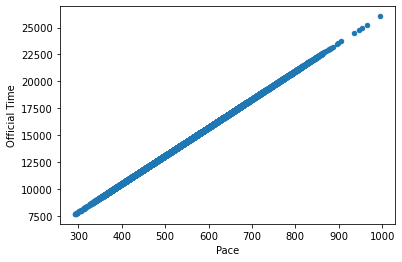

In [9]:
# 'Pace' should be perfectly correlated with 'Official Time', so we'll remove it from our X data (but keep it for analysis)
# Plot a scatter plot of 'Pace' against 'Official Time'
df.plot(kind='scatter', x='Pace', y='Official Time')

In [10]:
# Create a training set 'X' with every column except 'Pace'
X = df.drop('Pace', axis=1)

# Alternatively, select all the columns to keep
#X = df[['Age', 'M/F','5K','10K','15K','20K','25K','30K','35K','40K','Half','Official Time']]

In [11]:
# Scale the dataset using MinMaxScaler()
X_scaled = MinMaxScaler().fit_transform(X)
X_scaled

array([[1.84615385e-01, 1.00000000e+00, 2.84399833e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.69230769e-01, 1.00000000e+00, 2.80217482e-02, ...,
        0.00000000e+00, 5.79072326e-05, 1.08843537e-04],
       [2.46153846e-01, 1.00000000e+00, 2.96946884e-02, ...,
        0.00000000e+00, 0.00000000e+00, 5.44217687e-04],
       ...,
       [5.07692308e-01, 1.00000000e+00, 6.03094939e-01, ...,
        9.84187267e-01, 9.51705368e-01, 9.42965986e-01],
       [4.30769231e-01, 0.00000000e+00, 6.15641991e-01, ...,
        9.93509184e-01, 9.56453761e-01, 9.56734694e-01],
       [3.69230769e-01, 1.00000000e+00, 3.26641573e-01, ...,
        1.00000000e+00, 1.00000000e+00, 1.00000000e+00]])

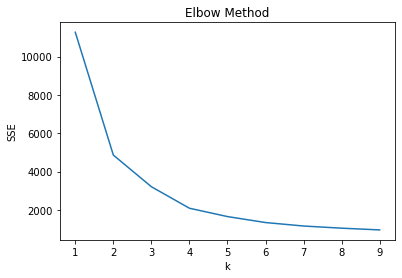

In [12]:
sse = {}
K = range(1,10)
for k in K:
    kmeanmodel = KMeans(n_clusters=k).fit(X_scaled)
    sse[k]= kmeanmodel.inertia_
    
# Plot
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel('k')
plt.ylabel('SSE')
plt.title('Elbow Method')
plt.show()

In [13]:
# Create a KMeans model with 3 clusters
model = KMeans(n_clusters=3, random_state=42).fit(X_scaled)

In [14]:
# Calculate predicted values.
y_pred = model.predict(X_scaled)

In [15]:
# Add prediected values onto the original dataframe
df_y = pd.DataFrame(y_pred, columns=['Cluster'])
combined = df.join(df_y, how='inner')
combined.head()

,Age,M/F,5K,10K,15K,20K,Half,25K,30K,35K,40K,Pace,Official Time,Cluster
0,30,1,911.0,1821.0,2748.0,3676.0,3869.0,4583.0,5521.0,6436.0,7305.0,293.0,7677.0,0
1,29,1,910.0,1822.0,2746.0,3676.0,3870.0,4584.0,5521.0,6436.0,7306.0,293.0,7679.0,0
2,34,1,914.0,1822.0,2747.0,3677.0,3871.0,4584.0,5521.0,6436.0,7305.0,294.0,7687.0,0
3,32,1,914.0,1824.0,2747.0,3676.0,3871.0,4584.0,5521.0,6436.0,7328.0,295.0,7734.0,0
4,26,1,912.0,1821.0,2746.0,3675.0,3868.0,4583.0,5521.0,6436.0,7317.0,296.0,7735.0,0


<AxesSubplot:title={'center':'Official Time'}, xlabel='[Cluster]'>

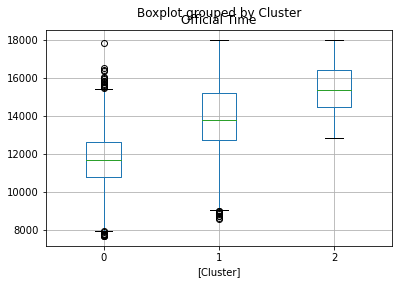

In [16]:
# Plot boxplots of the official time distributions by cluster
combined.boxplot(['Official Time'], by=['Cluster'])

In [17]:
# Print out summary statistics of ages by M/F and Cluster
combined.groupby(['M/F','Cluster']).describe()['Age']

count       mean        std   min   25%   50%   75%   max
M/F Cluster                                                            
0   0        2517.0  36.437028   8.746684  18.0  29.0  36.0  42.0  66.0
    1        5054.0  40.922438  10.638675  18.0  32.0  41.0  48.0  75.0
    2        2069.0  43.509908  11.197045  18.0  35.0  45.0  51.0  72.0
1   0        6044.0  40.346128   9.852292  18.0  33.0  40.0  48.0  80.0
    1        4813.0  47.259713  11.285711  18.0  39.0  48.0  56.0  82.0
    2        1532.0  50.374021  12.329217  18.0  42.0  53.0  60.0  80.0

In [18]:
# Create a function that takes in gender and age and assigns an age group based on the following break points for each gender:
# * The lowest 1st quartile
# * Each median
# * The highest 3rd quartile
def age_group(gender, age):
    if gender == 0:
        if age < 29:
            return 0
        elif age < 36:
            return 1
        elif age < 41:
            return 2
        elif age < 45:
            return 3
        elif age < 51:
            return 4
        else:
            return 5
    if gender == 1:
        if age < 33:
            return 0
        elif age < 40:
            return 1
        elif age < 48:
            return 2
        elif age < 53:
            return 3
        elif age < 60:
            return 4
        else:
            return 5

In [19]:
# Apply the custom age group to the original data frame and save it to the column 'Age Group'
df['Age Group'] = df.apply(lambda row: age_group(row['M/F'], row['Age']), axis=1)
df.head()

,Age,M/F,5K,10K,15K,20K,Half,25K,30K,35K,40K,Pace,Official Time,Age Group
0,30,1,911.0,1821.0,2748.0,3676.0,3869.0,4583.0,5521.0,6436.0,7305.0,293.0,7677.0,0
1,29,1,910.0,1822.0,2746.0,3676.0,3870.0,4584.0,5521.0,6436.0,7306.0,293.0,7679.0,0
2,34,1,914.0,1822.0,2747.0,3677.0,3871.0,4584.0,5521.0,6436.0,7305.0,294.0,7687.0,1
3,32,1,914.0,1824.0,2747.0,3676.0,3871.0,4584.0,5521.0,6436.0,7328.0,295.0,7734.0,0
4,26,1,912.0,1821.0,2746.0,3675.0,3868.0,4583.0,5521.0,6436.0,7317.0,296.0,7735.0,0


### Part 3: PCA

In [20]:
# Create a new training set 'X' by dropping 'Pace' and 'Age' from df
X = df.drop(['Age','Pace'], axis=1)

In [21]:
# Scale the dataset using MinMaxScaler()
X_scaled = MinMaxScaler().fit_transform(X)
X_scaled

array([[1.00000000e+00, 2.84399833e-02, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.00000000e+00, 2.80217482e-02, 2.56213169e-04, ...,
        5.79072326e-05, 1.08843537e-04, 0.00000000e+00],
       [1.00000000e+00, 2.96946884e-02, 2.56213169e-04, ...,
        0.00000000e+00, 5.44217687e-04, 2.00000000e-01],
       ...,
       [1.00000000e+00, 6.03094939e-01, 7.03817576e-01, ...,
        9.51705368e-01, 9.42965986e-01, 6.00000000e-01],
       [0.00000000e+00, 6.15641991e-01, 8.31155521e-01, ...,
        9.56453761e-01, 9.56734694e-01, 8.00000000e-01],
       [1.00000000e+00, 3.26641573e-01, 3.82526262e-01, ...,
        1.00000000e+00, 1.00000000e+00, 4.00000000e-01]])

In [22]:
# Reduce the number of components in X to 2 using PCA
pca = PCA(n_components=2)
pca.fit(X_scaled)
print(pca.explained_variance_ratio_)

X_pca = pca.transform(X_scaled)

[0.53729596 0.29601382]


In [23]:
df_pca = pd.DataFrame(X_pca, columns=['principal component 1','principal component 2'])

<AxesSubplot:xlabel='principal component 1', ylabel='principal component 2'>

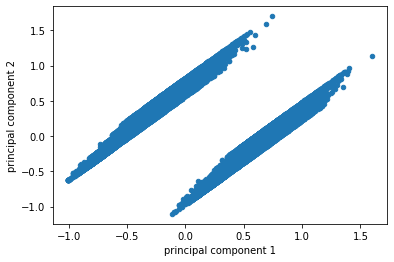

In [33]:
# df_pca.hvplot.scatter(
#     x="principal component 1",
#     y="principal component 2"
# )

df_pca.plot(kind="scatter", x="principal component 1", y="principal component 2")


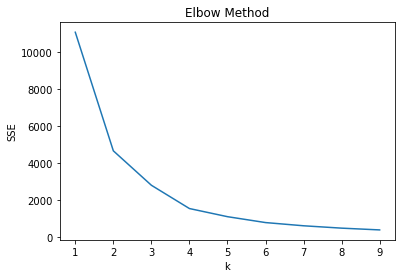

In [26]:
sse = {}
K = range(1,10)
for k in K:
    kmeanmodel = KMeans(n_clusters=k).fit(X_pca)
    sse[k]= kmeanmodel.inertia_
    
# Plot
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel('k')
plt.ylabel('SSE')
plt.title('Elbow Method')
plt.show()

In [27]:
# Create a KMeans model with 4 clusters
model = KMeans(n_clusters=4, random_state=42).fit(X_pca)

In [28]:
# Calculate predicted values.
y_pred = model.fit_predict(X_pca)

<AxesSubplot:xlabel='principal component 1', ylabel='principal component 2'>

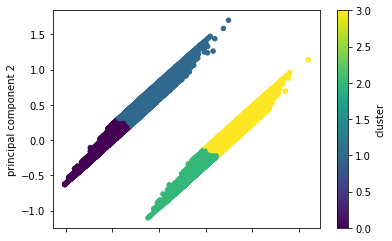

In [47]:
# Add predicted values to df_pca and replot the scatter plot of the PCA components, coloring by predicted cluster
df_pca["cluster"] = y_pred
# df_pca.hvplot.scatter(
#     x="principal component 1",
#     y="principal component 2",
#     by="cluster"
# )

df_pca.plot(kind='scatter', x='principal component 1', y='principal component 2', c='cluster', cmap="viridis")

In [37]:
# Add prediected values onto the original dataframe
df_y = pd.DataFrame(y_pred, columns=['Cluster'])
combined = df.join(df_y, how='inner')
combined.head()

,Age,M/F,5K,10K,15K,20K,Half,25K,30K,35K,40K,Pace,Official Time,Age Group,Cluster
0,30,1,911.0,1821.0,2748.0,3676.0,3869.0,4583.0,5521.0,6436.0,7305.0,293.0,7677.0,0,0
1,29,1,910.0,1822.0,2746.0,3676.0,3870.0,4584.0,5521.0,6436.0,7306.0,293.0,7679.0,0,0
2,34,1,914.0,1822.0,2747.0,3677.0,3871.0,4584.0,5521.0,6436.0,7305.0,294.0,7687.0,1,0
3,32,1,914.0,1824.0,2747.0,3676.0,3871.0,4584.0,5521.0,6436.0,7328.0,295.0,7734.0,0,0
4,26,1,912.0,1821.0,2746.0,3675.0,3868.0,4583.0,5521.0,6436.0,7317.0,296.0,7735.0,0,0


<AxesSubplot:title={'center':'Pace'}, xlabel='[M/F, Cluster]'>

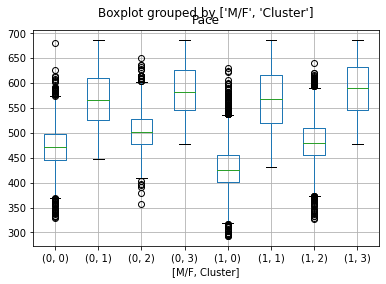

In [38]:
# Show a boxplot of Pace by M/F and cluster
combined.boxplot(['Pace'], by=['M/F','Cluster'])

In [39]:
# Display summary statistics on Pace grouped by M/F and cluster
combined.groupby(['M/F','Cluster']).describe()['Pace']

count        mean        std    min    25%    50%     75%    max
M/F Cluster                                                                   
0   0        1960.0  471.619898  42.905084  329.0  446.0  471.0  497.00  681.0
    1        2626.0  569.539223  54.883997  447.0  526.0  566.0  609.75  687.0
    2        2648.0  504.504909  37.448829  358.0  478.0  501.0  528.00  651.0
    3        2406.0  586.398171  49.505742  478.0  546.0  582.0  627.00  687.0
1   0        5565.0  429.950764  43.541370  293.0  401.0  426.0  455.00  631.0
    1        2011.0  568.290900  60.001388  432.0  519.0  567.0  616.00  687.0
    2        2904.0  482.492769  44.901775  328.0  455.0  480.0  509.25  640.0
    3        1909.0  590.019906  51.395307  477.0  545.0  589.0  632.00  687.0

# Make the call! What breakpoints do you suggest using for pace breakdowns?